In [1]:
import matplotlib.pyplot as plt
import gensim
import numpy as np


import spacy
import nltk
from nltk.corpus import reuters
from gensim.models import Word2Vec, FastText
from gensim.models.phrases import Phrases, Phraser
# Download NLTK corpus (if not already downloaded)
nltk.download('reuters')
# Load the reuters corpus
corpus = reuters.sents()
# Load a spaCy model for tokenization
nlp = spacy.load("en_core_web_sm")

from gensim.models import CoherenceModel, LdaModel, LsiModel, HdpModel
# from gensim.models.wrappers import LdaMallet
from gensim.corpora import Dictionary
import pyLDAvis.gensim

import os, re, operator, warnings
warnings.filterwarnings('ignore')  # Let's not pay heed to them right now
%matplotlib inline


[nltk_data] Downloading package reuters to
[nltk_data]     C:\Users\Lenovo\AppData\Roaming\nltk_data...
[nltk_data]   Package reuters is already up-to-date!


In [2]:
my_stop_words = [u'say', u'\'s', u's', u'Mr', u'be', u'said', u'says', u'saying' , u'pct', u'vs', u'dlrs', u'mln' , u'>', u'lt']
for stopword in my_stop_words:
    lexeme = nlp.vocab[stopword]
    lexeme.is_stop = True

In [3]:
# # preprocessing
# # we add some words to the stop word list
# texts, article, skl_texts = [], [], []
# for w in corpus:
#     # if it's not a stop word or punctuation mark, add it to our article!
#     if w.text != '\n' and not w.is_stop and not w.is_punct and not w.like_num:
#         # we add the lematized version of the word
#         article.append(w.lemma_)
#     # if it's a new line, it means we're onto our next document
#     if w.text == '\n':
#         skl_texts.append(' '.join(article))
#         texts.append(article)
#         article = []

In [4]:

tokenized_corpus  = []
skl_texts = []
for document in corpus:
    text = []
    text_data = " ".join(document)  # Convert the list of words into a single string
    # skl_texts.append(text_data)
    doc = nlp(text_data)
    for token in doc:
        if not token.is_stop and not token.is_punct and not token.like_num:
            text.append(token.lemma_.lower())
    skl_texts.append(' '.join(text))
    tokenized_corpus .append(text)
print(tokenized_corpus )


[['asian', 'exporters', 'fear', 'damage', 'u', 's', 'japan', 'rift', 'mounting', 'trade', 'friction', 'u', 's', 'japan', 'raise', 'fear', 'asia', 'export', 'nation', 'row', 'inflict', 'far', 'reach', 'economic', 'damage', 'businessman', 'official'], ['tell', 'reuter', 'correspondent', 'asian', 'capital', 'u', 's', 'japan', 'boost', 'protectionist', 'sentiment', 'u', 's', 'lead', 'curb', 'american', 'import', 'product'], ['exporter', 'conflict', 'hurt', 'long', 'run', 'short', 'term', 'tokyo', 'loss', 'gain'], ['u', 's', 'impose', 'tariff', 'import', 'japanese', 'electronic', 'good', 'april', 'retaliation', 'japan', 'allege', 'failure', 'stick', 'pact', 'sell', 'semiconductor', 'world', 'market', 'cost'], ['unofficial', 'japanese', 'estimate', 'impact', 'tariff', 'spokesman', 'major', 'electronic', 'firm', 'virtually', 'halt', 'export', 'product', 'hit', 'new', 'taxis'], ['wouldn', 't', 'able', 'business', 'spokesman', 'lead', 'japanese', 'electronics', 'firm', 'matsushita', 'electric',

In [5]:
# train bigram and trigram
bigram = Phrases(tokenized_corpus, min_count=5, threshold=10)
trigram = Phrases(bigram[tokenized_corpus], min_count=5, threshold=10)


In [6]:
# apply  models
tokenized_corpus_with_bigrams = [bigram[sentence] for sentence in tokenized_corpus]
tokenized_corpus_with_trigrams = [trigram[bigram[sentence]] for sentence in tokenized_corpus_with_bigrams]
tokenized_corpus_with_trigrams[1][0:10]

['tell_reuter',
 'correspondent',
 'asian',
 'capital',
 'u_s',
 'japan',
 'boost',
 'protectionist_sentiment_u_s',
 'lead',
 'curb']

In [7]:
# print bigrams and trigrams
for i, sentence in enumerate(tokenized_corpus_with_trigrams):
    if i < 5: 
        print(f"Sentence {i + 1} - Bigrams and Trigrams:")
        for word in sentence:
            if '_' in word:
                print(word)
        print("\n")

Sentence 1 - Bigrams and Trigrams:
u_s
trade_friction
u_s


Sentence 2 - Bigrams and Trigrams:
tell_reuter
u_s
protectionist_sentiment_u_s


Sentence 3 - Bigrams and Trigrams:
long_run
short_term


Sentence 4 - Bigrams and Trigrams:
u_s
impose_tariff
japanese_electronic_good
allege_failure
world_market


Sentence 5 - Bigrams and Trigrams:




In [8]:
from gensim import corpora
dictionary = corpora.Dictionary(tokenized_corpus_with_trigrams)
corpus = [dictionary.doc2bow(text) for text in tokenized_corpus_with_trigrams]

In [9]:
corpus[1][0:10]

[(1, 1),
 (10, 1),
 (19, 1),
 (20, 1),
 (21, 1),
 (22, 1),
 (23, 1),
 (24, 1),
 (25, 1),
 (26, 1)]

In [10]:
print(corpus)

[[(0, 1), (1, 1), (2, 1), (3, 2), (4, 1), (5, 1), (6, 1), (7, 1), (8, 2), (9, 1), (10, 2), (11, 1), (12, 1), (13, 1), (14, 1), (15, 1), (16, 1), (17, 1), (18, 1), (19, 2)], [(1, 1), (10, 1), (19, 1), (20, 1), (21, 1), (22, 1), (23, 1), (24, 1), (25, 1), (26, 1), (27, 1), (28, 1), (29, 1)], [(30, 1), (31, 1), (32, 1), (33, 1), (34, 1), (35, 1), (36, 1), (37, 1)], [(10, 1), (19, 1), (25, 1), (38, 1), (39, 1), (40, 1), (41, 1), (42, 1), (43, 1), (44, 1), (45, 1), (46, 1), (47, 1), (48, 1)], [(5, 1), (27, 1), (49, 1), (50, 1), (51, 1), (52, 1), (53, 1), (54, 1), (55, 1), (56, 1), (57, 1), (58, 1), (59, 1), (60, 1), (61, 1), (62, 1)], [(26, 1), (51, 1), (55, 1), (58, 1), (63, 1), (64, 1), (65, 1), (66, 1), (67, 1), (68, 1), (69, 1), (70, 1), (71, 1), (72, 1)], [(5, 1), (19, 1), (37, 1), (59, 2), (73, 1), (74, 1), (75, 1), (76, 1), (77, 1), (78, 1), (79, 1), (80, 1), (81, 1), (82, 1), (83, 1), (84, 1), (85, 1), (86, 1), (87, 1), (88, 1), (89, 1), (90, 1)], [(2, 1), (13, 1), (91, 1), (92, 1)]

In [11]:
print(dictionary)

Dictionary<32279 unique tokens: ['asia', 'asian', 'businessman', 'damage', 'economic']...>


# LSI

In [12]:
lsimodel = LsiModel(corpus=corpus, num_topics=10, id2word=dictionary)
lsimodel.show_topics(num_topics=5)  # Showing only the top 5 topics


[(0,
  '0.524*"year" + 0.335*"lt" + 0.322*"company" + 0.274*"share" + 0.253*"u_s" + 0.126*"price" + 0.123*"rise" + 0.113*"sale" + 0.105*"bank" + 0.100*"expect"'),
 (1,
  '-0.626*"year" + 0.497*"lt" + 0.320*"share" + 0.308*"company" + 0.131*"inc" + 0.121*"corp" + -0.116*"rise" + -0.104*"u_s" + -0.104*"tonne" + 0.081*"offer"'),
 (2,
  '0.770*"u_s" + -0.431*"year" + -0.180*"lt" + 0.138*"japan" + -0.136*"share" + 0.127*"market" + 0.120*"price" + 0.101*"official" + 0.081*"export" + 0.076*"trade"'),
 (3,
  '-0.675*"company" + 0.605*"lt" + -0.237*"share" + 0.190*"u_s" + 0.125*"corp" + 0.116*"inc" + -0.087*"price" + 0.081*"unit" + 0.073*"year" + -0.043*"offer"'),
 (4,
  '-0.793*"share" + 0.512*"company" + 0.201*"lt" + -0.106*"offer" + -0.098*"price" + -0.062*"market" + 0.049*"unit" + 0.045*"corp" + 0.045*"inc" + 0.045*"sale"')]

# HDP

In [13]:
hdpmodel = HdpModel(corpus=corpus, id2word=dictionary)
hdpmodel.show_topics()


[(0,
  '0.009*year + 0.007*company + 0.007*u_s + 0.006*share + 0.005*lt + 0.004*bank + 0.004*rise + 0.004*tonne + 0.004*price + 0.003*market + 0.003*expect + 0.003*export + 0.003*sale + 0.003*month + 0.003*increase + 0.002*japan + 0.002*new + 0.002*plan + 0.002*offer + 0.002*january'),
 (1,
  '0.005*year + 0.005*u_s + 0.003*company + 0.003*price + 0.003*bank + 0.003*market + 0.003*rise + 0.003*japan + 0.002*tonne + 0.002*share + 0.002*february + 0.002*official + 0.002*lt + 0.002*fall + 0.002*add + 0.002*report + 0.002*expect + 0.002*increase + 0.002*oil + 0.002*quarter'),
 (2,
  '0.007*year + 0.005*loss + 0.004*company + 0.004*share + 0.004*lt + 0.003*sale + 0.003*quarter + 0.002*u_s + 0.002*net_loss + 0.002*ct_share + 0.002*net + 0.002*rise + 0.002*note + 0.002*earning + 0.002*month + 0.002*corp_lt + 0.002*expect + 0.002*bank + 0.002*profit + 0.001*price'),
 (3,
  '0.005*year + 0.004*u_s + 0.003*price + 0.003*company + 0.002*lt + 0.002*market + 0.002*share + 0.002*rise + 0.002*month +

# LDA

In [14]:
ldamodel = LdaModel(corpus=corpus, num_topics=10, id2word=dictionary)
ldamodel.show_topics()


[(0,
  '0.036*"year" + 0.024*"company" + 0.021*"profit" + 0.020*"quarter" + 0.020*"loss" + 0.019*"sale" + 0.018*"stg" + 0.013*"tax" + 0.012*"result" + 0.012*"net"'),
 (1,
  '0.019*"u_s" + 0.017*"canada" + 0.010*"canadian" + 0.010*"proposal" + 0.010*"budget" + 0.009*"gulf" + 0.009*"review" + 0.009*"oil" + 0.009*"strike" + 0.008*"steel"'),
 (2,
  '0.012*"revise" + 0.012*"additional" + 0.011*"think" + 0.010*"go" + 0.010*"n" + 0.009*"morning" + 0.009*"ask" + 0.009*"leave" + 0.009*"action" + 0.009*"qtr_jan_net_shr"'),
 (3,
  '0.049*"share" + 0.038*"company" + 0.023*"offer" + 0.013*"buy" + 0.013*"stock" + 0.009*"shareholder" + 0.009*"hold" + 0.009*"group" + 0.009*"bid" + 0.007*"plan"'),
 (4,
  '0.015*"ec" + 0.011*"new" + 0.009*"energy" + 0.009*"order" + 0.008*"industry" + 0.008*"bill" + 0.007*"state" + 0.007*"oil" + 0.007*"country" + 0.006*"export"'),
 (5,
  '0.038*"year" + 0.032*"rise" + 0.018*"february" + 0.017*"january" + 0.016*"expect" + 0.015*"month" + 0.014*"fall" + 0.013*"bank" + 0.01

# Topic Modelling with scikit-learn

In [15]:
import sklearn
from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer
from sklearn.datasets import fetch_20newsgroups
from sklearn.decomposition import NMF, LatentDirichletAllocation


In [16]:
dataset = fetch_20newsgroups(shuffle=True, random_state=1, remove=('headers', 'footers', 'quotes'))
documents = dataset.data

In [17]:
documents

["Well i'm not sure about the story nad it did seem biased. What\nI disagree with is your statement that the U.S. Media is out to\nruin Israels reputation. That is rediculous. The U.S. media is\nthe most pro-israeli media in the world. Having lived in Europe\nI realize that incidences such as the one described in the\nletter have occured. The U.S. media as a whole seem to try to\nignore them. The U.S. is subsidizing Israels existance and the\nEuropeans are not (at least not to the same degree). So I think\nthat might be a reason they report more clearly on the\natrocities.\n\tWhat is a shame is that in Austria, daily reports of\nthe inhuman acts commited by Israeli soldiers and the blessing\nreceived from the Government makes some of the Holocaust guilt\ngo away. After all, look how the Jews are treating other races\nwhen they got power. It is unfortunate.\n",
 "\n\n\n\n\n\n\nYeah, do you expect people to read the FAQ, etc. and actually accept hard\natheism?  No, you need a little leap

In [18]:
def display_topics(model, feature_names, no_top_words):
    for topic_idx, topic in enumerate(model.components_):
        print ("Topic %d:", topic_idx)
        val = " ".join([feature_names[i]
                        for i in topic.argsort()[:-no_top_words - 1:-1]])
        print(val)

In [19]:
no_features = 1000
no_topics = 10
no_top_words = 10

In [20]:
# NMF is able to use tf-idf
tfidf_vectorizer = TfidfVectorizer(max_df=0.95, min_df=2, max_features=no_features, stop_words='english')
tfidf = tfidf_vectorizer.fit_transform(skl_texts)
tfidf_feature_names = tfidf_vectorizer.get_feature_names_out()

In [21]:
# LDA can only use raw term counts for LDA because it is a probabilistic graphical model
tf_vectorizer = CountVectorizer(max_df=0.95, min_df=2, max_features=no_features, stop_words='english')
tf = tf_vectorizer.fit_transform(skl_texts)
tf_feature_names = tf_vectorizer.get_feature_names_out()

In [22]:
# Run NMF
nmf = NMF(n_components=no_topics, random_state=1, l1_ratio=.5, init='nndsvd').fit(tfidf)
display_topics(nmf, tfidf_feature_names, no_top_words)

Topic %d: 0
net ct shr revs qtr avg lt shrs mth note
Topic %d: 1
year quarter end expect early ago sale earning report compare
Topic %d: 2
share stock offer common outstanding tender buy cash exchange shareholder
Topic %d: 3
loss profit oper include tax operation quarter report revs discontinued
Topic %d: 4
bank rate market dollar trade japan exchange central money yen
Topic %d: 5
company sale plan shareholder new spokesman board expect hold acquisition
Topic %d: 6
tonne price oil export import production wheat crude barrel estimate
Topic %d: 7
ct april record pay div qtly prior dividend march quarterly
Topic %d: 8
lt corp group unit acquire sell stake acquisition subsidiary buy
Topic %d: 9
rise february january fall month december compare increase index price


In [23]:

# Run LDA
lda = LatentDirichletAllocation(n_components=no_topics, max_iter=5, learning_method='online', learning_offset=50.,random_state=0).fit(tf)
display_topics(lda, tf_feature_names, no_top_words)

Topic %d: 0
year increase plan continue quarter economic deficit change company west
Topic %d: 1
rise april report record pay dividend december investment capital div
Topic %d: 2
lt oil corp company sell unit international cost price new
Topic %d: 3
trade official japan market cut tell department country president minister
Topic %d: 4
bank week add stg reserve today debt national money federal
Topic %d: 5
year tonne export expect production growth estimate spokesman import total
Topic %d: 6
ct net loss shr profit lt year qtr sale revs
Topic %d: 7
march term end gas remain long supply pct union complete
Topic %d: 8
share company stock offer group market hold common buy shareholder
Topic %d: 9
rate price january february fall dollar month exchange currency mark


In [24]:
tfidf_feature_names[2], tf_feature_names[2]

('accord', 'accord')

In [25]:
for line in tf:
    print (line)
    break

  (0, 221)	2
  (0, 281)	1
  (0, 317)	1
  (0, 329)	1
  (0, 332)	2
  (0, 459)	2
  (0, 564)	1
  (0, 593)	1
  (0, 720)	1
  (0, 724)	1
  (0, 926)	1


# pyLDAvis

In [26]:
pyLDAvis.enable_notebook()
pyLDAvis.gensim.prepare(ldamodel, corpus, dictionary)

PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
7     -0.151068  0.048339       1        1  14.832858
5     -0.053297  0.180791       2        1  13.480401
3      0.093844 -0.088142       3        1  12.480141
6     -0.072423  0.158918       4        1  11.803072
9      0.316230 -0.027100       5        1  11.599002
0      0.232659  0.103092       6        1   9.415108
4     -0.103502  0.010941       7        1   8.148856
8     -0.121201 -0.057933       8        1   6.982786
1     -0.096546 -0.013755       9        1   6.615606
2     -0.044697 -0.315151      10        1   4.642169, topic_info=           Term         Freq        Total Category  logprob  loglift
80           lt  5388.000000  5388.000000  Default  30.0000  30.0000
148       share  4303.000000  4303.000000  Default  29.0000  29.0000
103        year  7155.000000  7155.000000  Default  28.0000  28.0000
19          u_s  5268.000000  5268.000000  Default  27.0000  27.0000
299        rise  2872.000000  2872.000000  Default  26.0000  26.0000
...         ...          ...          ...      ...      ...      ...
534         use   191.674079   345.461689  Topic10  -4.9683   2.4809
950   potential   136.616507   178.542730  Topic10  -5.3069   2.8023
452      appear   140.682529   255.644829  Topic10  -5.2776   2.4727
491      system   163.041318   715.768982  Topic10  -5.1301   1.5906
1334   congress   137.182229   248.330467  Topic10  -5.3028   2.4765

[663 rows x 6 columns], token_table=      Topic      Freq     Term
term                          
1613      8  0.987241   abroad
863       1  0.001166  acquire
863       3  0.417384  acquire
863       5  0.486171  acquire
863       6  0.092104  acquire
...     ...       ...      ...
302       1  0.748237      yen
302       2  0.245411      yen
302       4  0.001334      yen
302       8  0.002668      yen
2598      8  0.993104        z

[1778 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[8, 6, 4, 7, 10, 1, 5, 9, 2, 3])

# Topic Coherence

Topic Coherence is a new gensim functionality where we can identify which topic model is 'better'. By returning a score, we can compare between different topic models of the same. We use the same example from the news classification notebook to plot a graph between the topic models we have created.

In [27]:
lsitopics = [[word for word, prob in topic] for topicid, topic in lsimodel.show_topics(formatted=False)]

hdptopics = [[word for word, prob in topic] for topicid, topic in hdpmodel.show_topics(formatted=False)]

ldatopics = [[word for word, prob in topic] for topicid, topic in ldamodel.show_topics(formatted=False)]


In [28]:
print(skl_texts)

['asian exporters fear damage u s japan rift mounting trade friction u s japan raise fear asia export nation row inflict far reach economic damage businessman official', 'tell reuter correspondent asian capital u s japan boost protectionist sentiment u s lead curb american import product', 'exporter conflict hurt long run short term tokyo loss gain', 'u s impose tariff import japanese electronic good april retaliation japan allege failure stick pact sell semiconductor world market cost', 'unofficial japanese estimate impact tariff spokesman major electronic firm virtually halt export product hit new taxis', 'wouldn t able business spokesman lead japanese electronics firm matsushita electric industrial co ltd lt mc t', 'tariff remain place length time month mean complete erosion export good subject tariff u s tom murtha stock analyst tokyo office broker lt james capel co', 'taiwan businessman official worried', 'aware seriousness u s', 'threat japan serve warning senior taiwanese trade 

In [29]:
lsi_coherence = CoherenceModel(topics=lsitopics[:10], texts=tokenized_corpus_with_trigrams, dictionary=dictionary, window_size=10).get_coherence()

hdp_coherence = CoherenceModel(topics=hdptopics[:10], texts=tokenized_corpus_with_trigrams, dictionary=dictionary, window_size=10).get_coherence()

lda_coherence = CoherenceModel(topics=ldatopics, texts=tokenized_corpus_with_trigrams, dictionary=dictionary, window_size=10).get_coherence()

In [30]:
def evaluate_bar_graph(coherences, indices):
    """
    Function to plot bar graph.
    
    coherences: list of coherence values
    indices: Indices to be used to mark bars. Length of this and coherences should be equal.
    """
    assert len(coherences) == len(indices)
    n = len(coherences)
    x = np.arange(n)
    plt.bar(x, coherences, width=0.2, tick_label=indices, align='center')
    plt.xlabel('Models')
    plt.ylabel('Coherence Value')

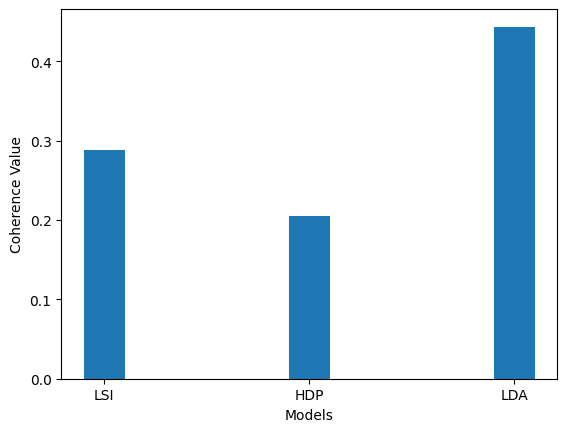

In [31]:
evaluate_bar_graph([lsi_coherence, hdp_coherence, lda_coherence],
                   ['LSI', 'HDP', 'LDA'])